Copyright 2021, Theorem Engine

This program is free software: you can redistribute it and/or modify it under the terms of the GNU General Public License as published by the Free Software Foundation, either version 3 of the License, or (at your option) any later version.

This program is distributed in the hope that it will be useful, but WITHOUT ANY WARRANTY; without even the implied warranty of MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the GNU General Public License for more details.

You should have received a copy of the GNU General Public License along with this program.  If not, see <https://www.gnu.org/licenses/>.

# <center> Durrett and Levin Model </center>

This notebook walks the user through a simple experiment using the *E. Coli* model from:

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Durrett and Levin. "Allelopathy in Spatially Distributed Populations." *Journal of Theoretical Biology* Vol. 185, pp. 165-171.

In this model, we have four states. The 0 state represents an empty point, while the remaining states are different strains for E. Coli bacteri:

1. A strain producing the antibiotic colicin. Often called P, for Producer.
2. A strain that produces a small amount of colicin; it reproduces faster since it is not investing as much energy in production. Often called R, for Resistant.
3. A strain that is vulnerable to colicin, but which reproduces much faster than the other two strains. Often called S, for susceptible.

These form a rock-paper-scissors model: strain R outcompetes strain P because
it is resistant to the colicin and reproduces faster; strain S outcompetes
strain R because strain R does not produce enough colicin to stop strain S,
which reproduces faster than strain R; and strain P outcompetes strain S
because it produces enough colicin to kill it.

In [1]:
%matplotlib inline

from itertools import product

from IPython.display import HTML
import matplotlib
from matplotlib import animation
import matplotlib.pyplot as plot
import numpy as np
import viridicle

# Allow larger videos than default limit
matplotlib.rcParams['animation.embed_limit'] = 30_000_000

# Radius of interaction neighborhood
RADIUS = 1.0
# Lattice width
WIDTH = 256

We begin by constructing the viridicle model. Since we do not specify an initial system state, it's initialized randomly for us.

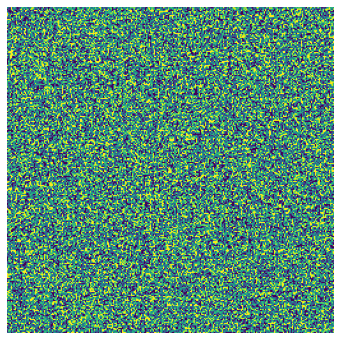

In [2]:
# Encode rules
rules = [
    '1,0->1,1@3.0', '2,0->2,2@3.2', '3,0->3,3@4.0',
    '1,*->0,*@1.0', '2,*->0,*@1.0', '3,*->0,*@1.0',
    '3,1->0,1@3.0', '3,2->0,2@0.5'
]
# Interaction neighborhood
neighborhood = np.stack(np.meshgrid(
    *([np.arange(-int(RADIUS), RADIUS + 1)] * 2)
), axis=2).reshape(-1, 2)
neighborhood = neighborhood[(neighborhood**2).sum(1) > 0, :]
neighborhood = neighborhood[(neighborhood**2).sum(1) <= RADIUS**2, :]
# Initialize model
geo = viridicle.LatticeGeography((WIDTH, WIDTH), rules, num_states=4)

# Display system initial state
plot.figure(figsize=(6, 6))
plot.imshow(geo.sites)
plot.axis('off')
plot.show()

We'll now run the model forward for 400 time, capturing the system state every 2.0 time.

In [3]:
counts, record = geo.run(400.0, return_sites=True, report_every=2.0)

Let's plot species abundances over time.

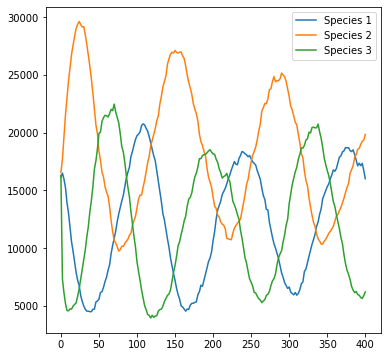

In [4]:
plot.figure(figsize=(6, 6))
for s in [1, 2, 3]:
    plot.plot(
        np.arange(0.0, 401.0, 2.0),
        counts[:, s],
        label=f'Species {s}',
    )
plot.legend()
plot.show()

And here's the video:

In [5]:
# Syntax taken from:
# https://stackoverflow.com/questions/51702749/numpy-array-as-video-in-jupyter-notebook

fig = plot.figure(figsize=(6, 6))
im = plot.imshow(record[0, :, :])
plot.axis('off')
plot.close()

def init():
    im.set_data(record[0, :, :])

def animate(i):
    im.set_data(record[i, :, :])
    return im

anim = animation.FuncAnimation(
    fig, animate, init_func=init, frames=record.shape[0],
    interval=50
)
HTML(anim.to_html5_video())

Unfortunately, this video does not render on GitHub. Here, at least is the final system state:

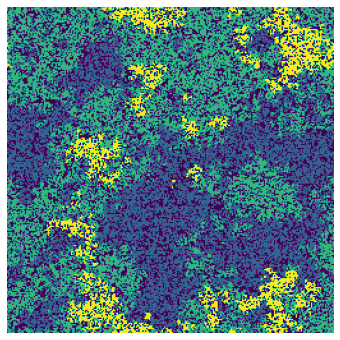

In [7]:
plot.figure(figsize=(6, 6))
plot.imshow(geo.sites)
plot.axis('off')
plot.show()